In [1]:
import xarray as xr
import matplotlib.pyplot as plt
import cmocean
import matplotlib
import matplotlib.colors as mcolors
import numpy as np
import geopandas as gpd

In [59]:
cmap = cmocean.cm.haline

# Make a copy
cmap = cmocean.cm.haline.copy()
cmap = matplotlib.cm.Blues.copy()

cmap = 'Blues_r'

# Choose the color
# cmap.set_bad(color=mcolors.XKCD_COLORS['xkcd:off white'])

In [50]:
coastline = gpd.read_file('/g/data/jk72/sc0554/floes/coastline_medium_res_bas_84.geojson').to_crs("EPSG:3031")
basemap = gpd.read_file('/g/data/jk72/sc0554/floes/ADDsimplebasemap.geojson')

In [62]:
iceconc = xr.open_dataset('/g/data/gv90/P6_data/tracker_data/sea_ice_conc_25km_cog/nsidc_sea_ice_conc_2021_2.tiff')

In [120]:
ds = xr.open_dataset('/g/data/gv90/P6_data/NSIDC/NSIDC-0116/icemotion_weekly_sh_25km_20210101_20211231_v4.1.nc')
ds = ds.isel(time=5)
ds = ds.rename({'u':'u-','v':'v-'})

In [117]:
ds = xr.open_dataset('/g/data/gv90/P6_data/NSIDC/NSIDC-0116/icemotion_weekly_sh_25km_20210101_20211231_v4.1.nc')
ds = ds.groupby('time.month').mean()
ds = ds.isel(month=2)
ds = ds.rename({'u':'u-','v':'v-'})

In [78]:
ds = xr.open_dataset('/g/data/gv90/P6_data/NSIDC/NSIDC-0116/icemotion_weekly_sh_25km_20210101_20211231_v4.1.nc')
ds = ds.sel(time=slice("2021-02-01", "2021-08-31")).groupby('time.month').mean(dim='time')
ds = ds.rename({'u':'u-','v':'v-'})
ds = ds.mean(dim='month')

ValueError: invalid day number provided in cftime.DatetimeJulian(2021, 2, 31, 0, 0, 0, 0, has_year_zero=False)

In [121]:
circum_antarctic_motion = ds.coarsen({'x':7}, boundary='trim').mean().coarsen({'y':7}, boundary='trim').mean()

In [63]:
test = xr.where(iceconc['band_data'] == 0, np.nan, iceconc['band_data'])

In [46]:
np.unique(basemap['Category'])

array(['Ice shelf', 'Ice tongue', 'Land', 'Ocean', 'Rumple',
       'Sub-antarctic_G', 'Sub-antarctic_L'], dtype=object)

In [106]:
ds.time

<xarray.DataArray 'time' ()>
array(cftime.DatetimeJulian(2021, 2, 5, 12, 0, 0, 0, has_year_zero=False),
      dtype=object)
Coordinates:
    time     object 2021-02-05 12:00:00
Attributes:
    standard_name:  time
    axis:           T

Text(0.5, 1.0, '')

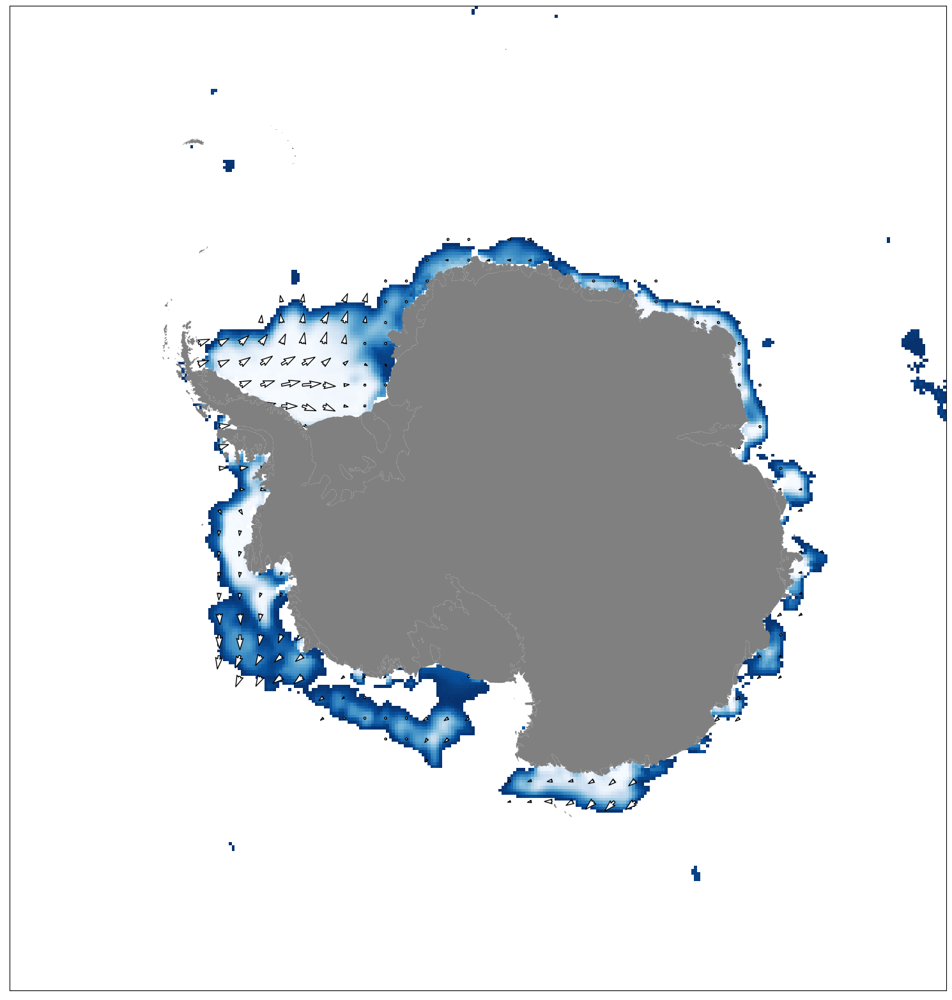

In [122]:
fig, ax = plt.subplots(figsize=(20,20))
# basemap.where(basemap['Category']=='Ocean').plot(ax=ax, color='Blue')
test.plot(cmap=cmap, ax=ax, vmin=0, vmax=100,add_colorbar=False)
# coastline.plot(ax=ax, color='b')
ax.quiver(circum_antarctic_motion['x'], circum_antarctic_motion['y'],circum_antarctic_motion['u-'], circum_antarctic_motion['v-'], color='white', edgecolors='black', linewidth=1, scale=250)
basemap.where(basemap['Category']!='Ocean').where(basemap['Category']!='Sub-antarctic_L').plot(ax=ax, color='Grey')
ax.yaxis.set_visible(False)
ax.xaxis.set_visible(False)
ax.set_title('')
# plt.savefig(f'/g/data/jk72/sc0554/figure5is2_R', dpi=300, bbox_inches='tight')

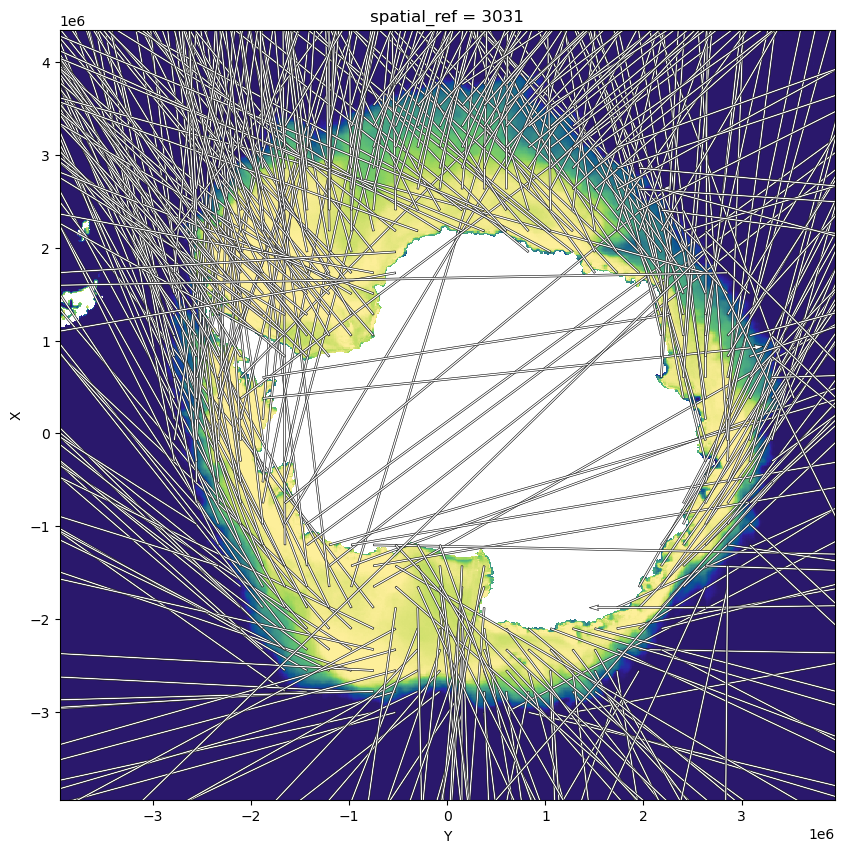

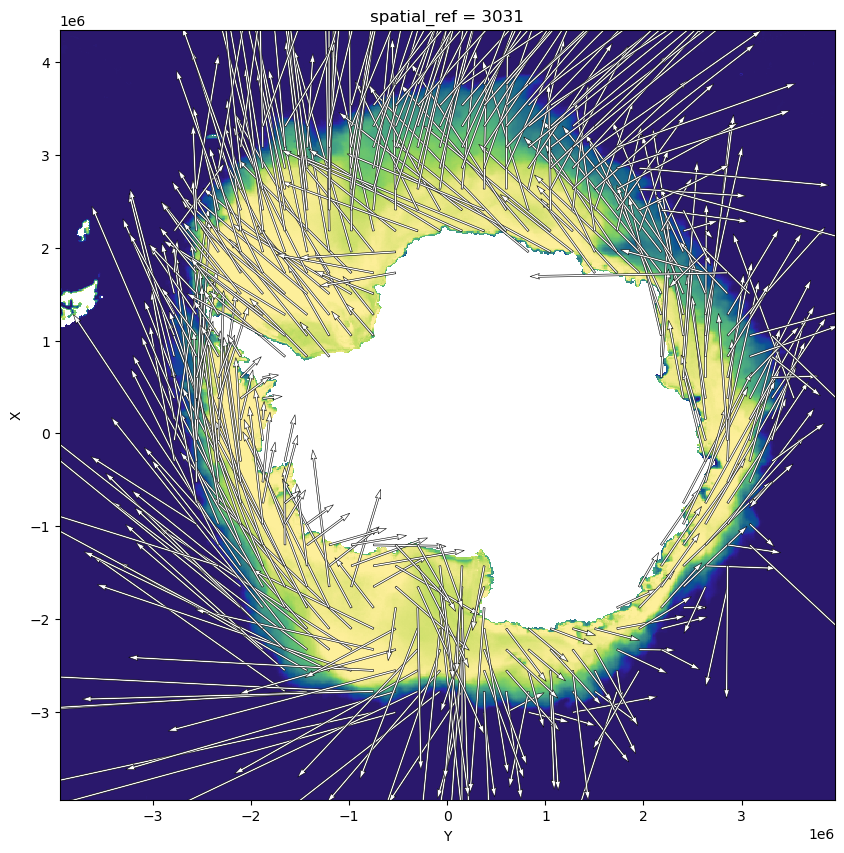

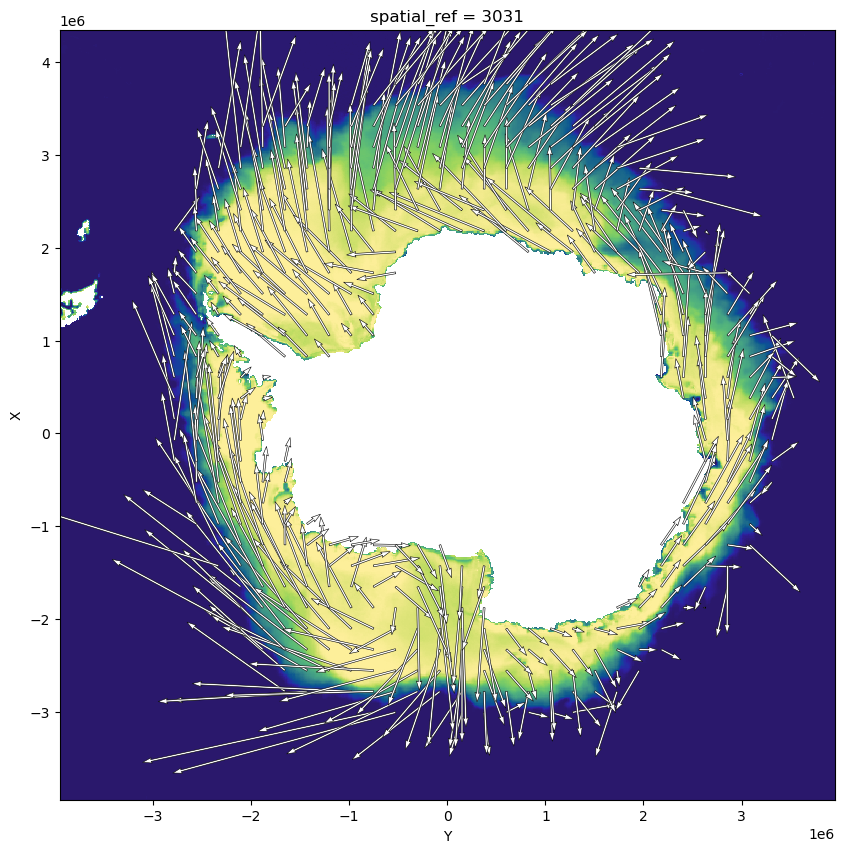

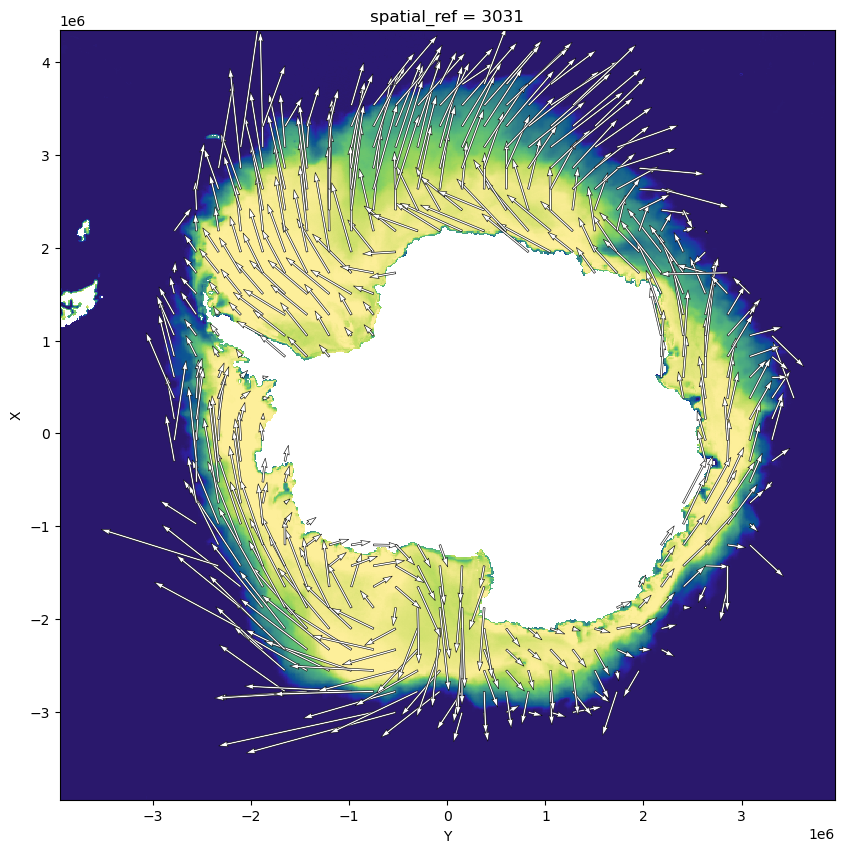

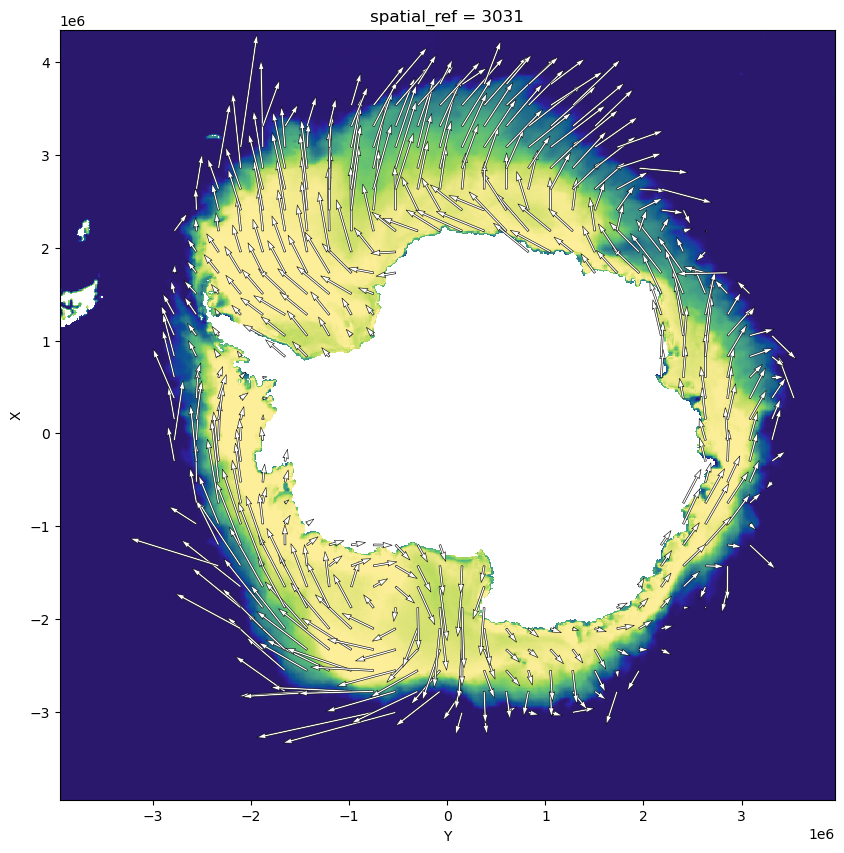

...

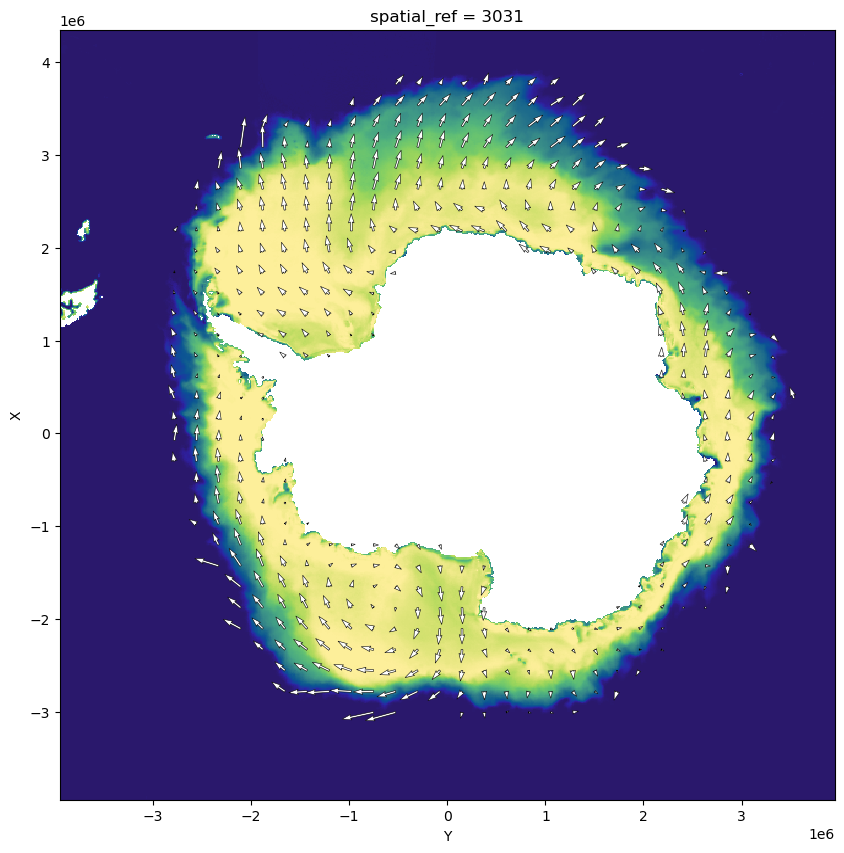

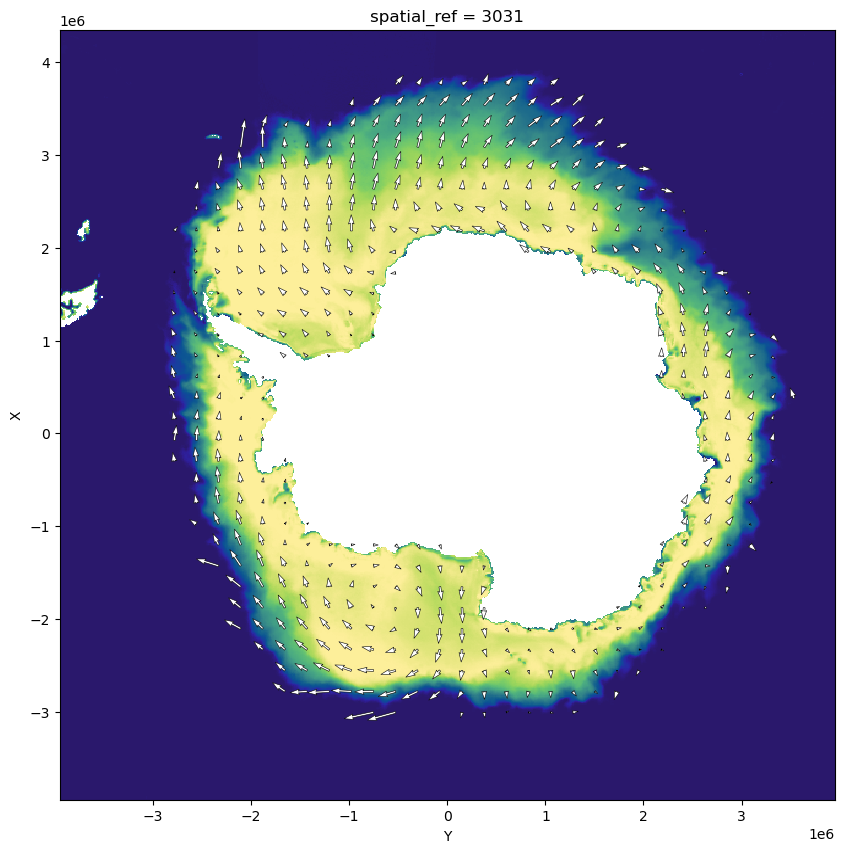

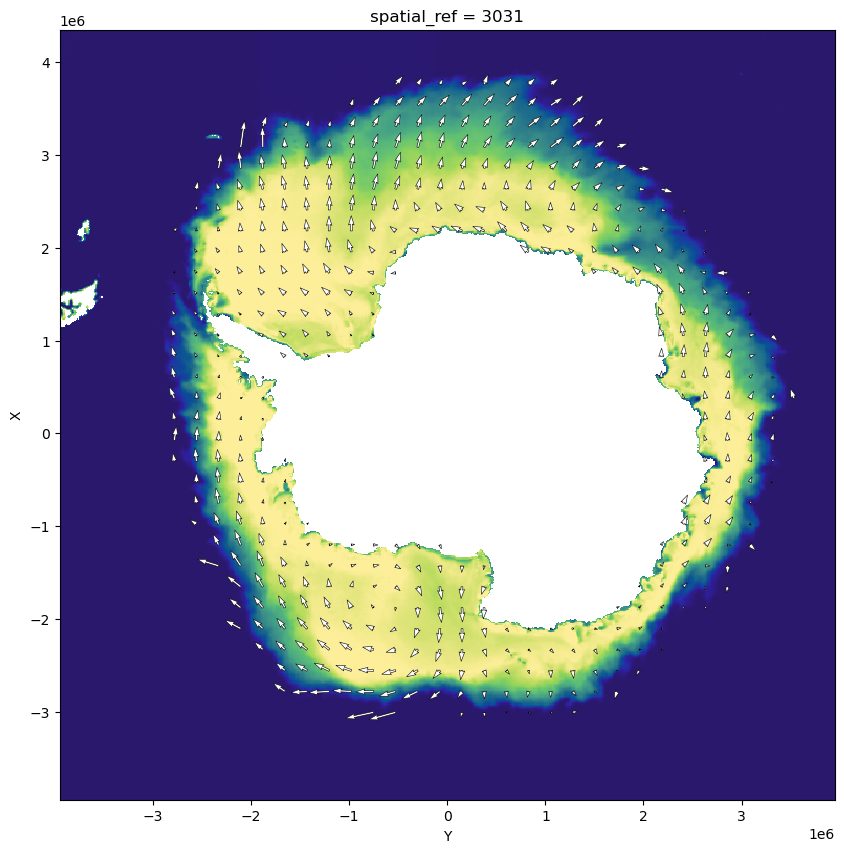

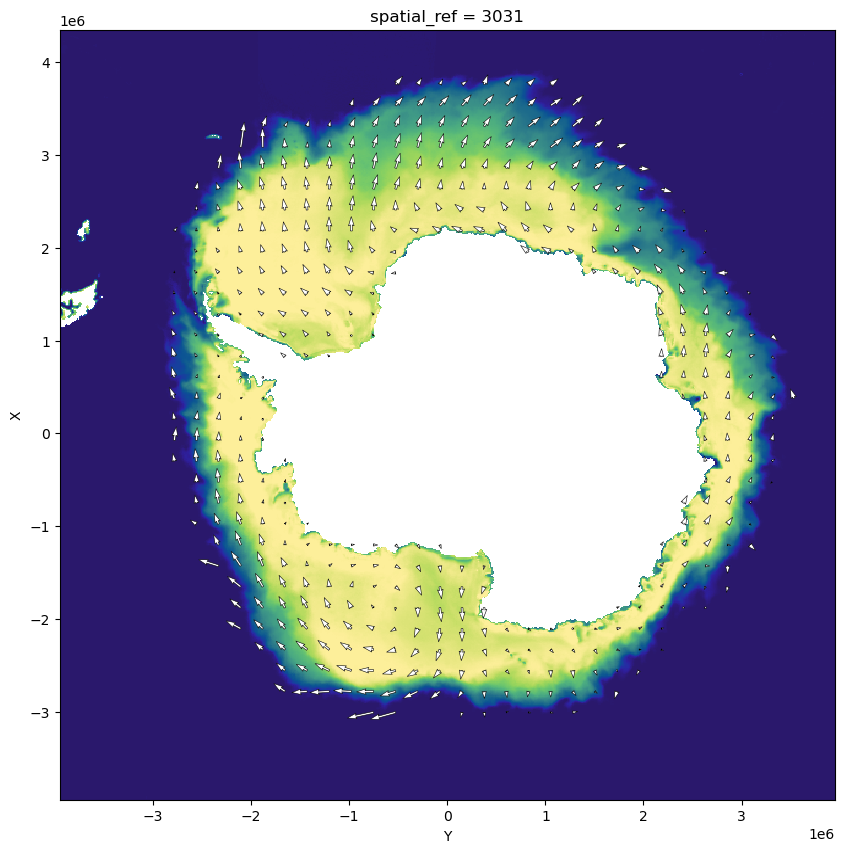

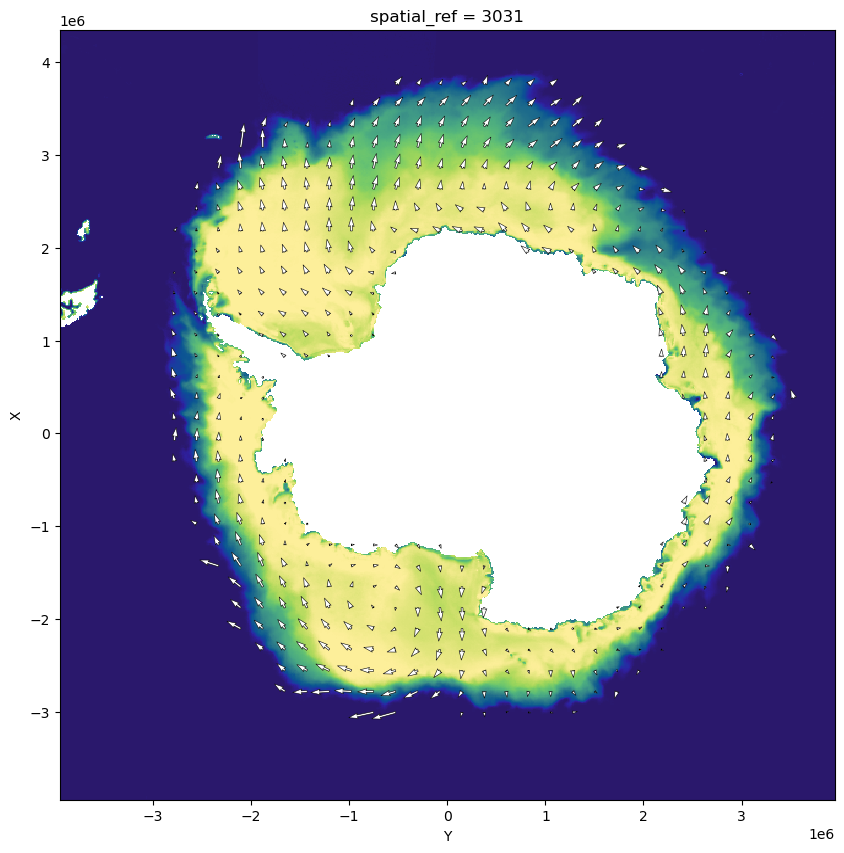

In [23]:
for i in range (1, 500, 25):
    fig, ax = plt.subplots(figsize=(10,10))
    icetype['TOTAL_ICE'].plot(cmap=cmap, ax=ax, vmin=0, vmax=100,add_colorbar=False)
    ax.quiver(circum_antarctic_motion['x'], circum_antarctic_motion['y'],circum_antarctic_motion['u-'], circum_antarctic_motion['v-'], color='white', edgecolors='black', linewidth=0.4, scale=i)
    # plt.savefig(f'/g/data/jk72/sc0554/vector_{i}.png', dpi=300, bbox_inches='tight')